<a href="https://colab.research.google.com/github/rogerli007/opencv-sample/blob/main/FeatureMatching.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

4.4.0
matches: 9090


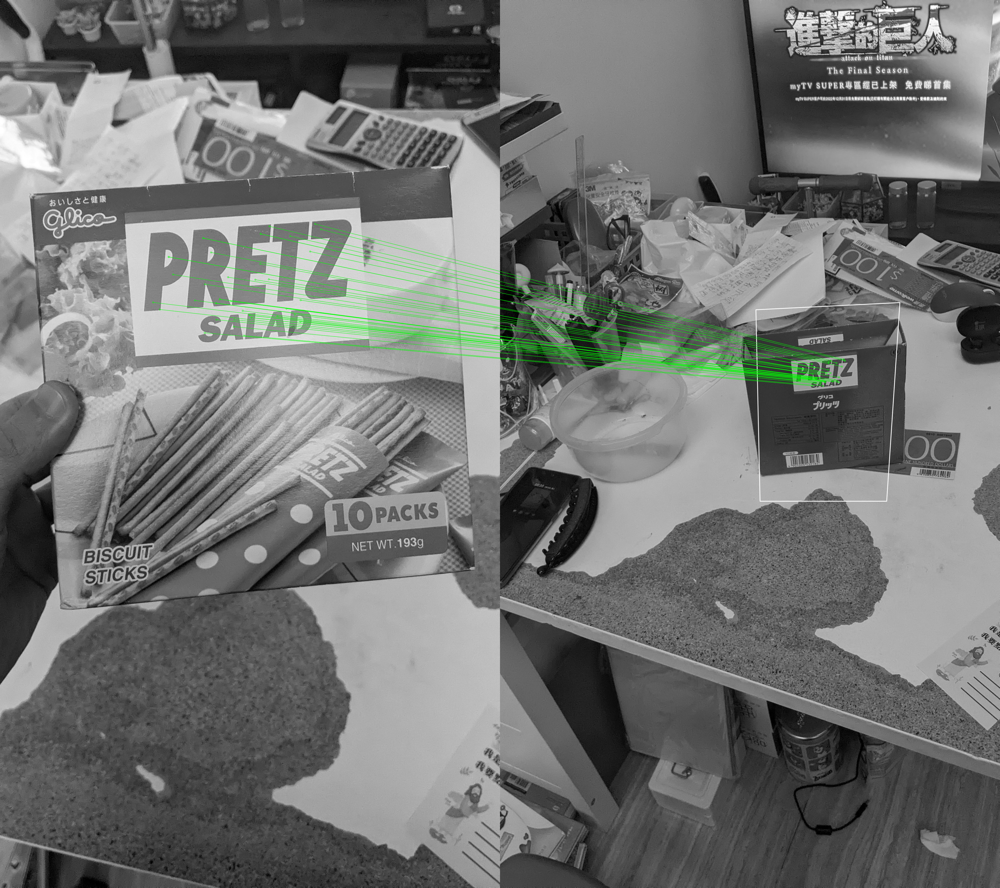

In [14]:
'''
 Based on the following tutorial:
   http://docs.opencv.org/3.0-beta/doc/py_tutorials/py_feature2d/py_feature_homography/py_feature_homography.html
'''

# print (cv2.__version__)
!pip install opencv-contrib-python==4.4.0.44
!pip install  opencv-python==4.4.0.44
import cv2 
# !pip install  opencv-contrib-python==3.4.2.17
print (cv2.__version__)

import numpy as np
from google.colab.patches import cv2_imshow
# import cv2

# Load the images in gray scale
# img1 = cv2.imread('/coupon.jpg', 0)
# img2 = cv2.imread('/coupon_full.jpg', 0)
img1 = cv2.imread('/01.jpg', 0)
img2 = cv2.imread('/03.jpg', 0)

# Detect the SIFT key points and compute the descriptors for the two images
sift = cv2.SIFT_create()
keyPoints1, descriptors1 = sift.detectAndCompute(img1, None)
keyPoints2, descriptors2 = sift.detectAndCompute(img2, None)

# Create brute-force matcher object
bf = cv2.BFMatcher()

# Match the descriptors
matches = bf.knnMatch(descriptors1, descriptors2, k=2)
print ("matches: " + str(len(matches)))

# Select the good matches using the ratio test
goodMatches = []

for m, n in matches:
    if m.distance < 0.7 * n.distance:
        goodMatches.append(m)

# Apply the homography transformation if we have enough good matches 
MIN_MATCH_COUNT = 10

if len(goodMatches) > MIN_MATCH_COUNT:
    # Get the good key points positions
    sourcePoints = np.float32([ keyPoints1[m.queryIdx].pt for m in goodMatches ]).reshape(-1, 1, 2)
    destinationPoints = np.float32([ keyPoints2[m.trainIdx].pt for m in goodMatches ]).reshape(-1, 1, 2)
    
    # Obtain the homography matrix
    M, mask = cv2.findHomography(sourcePoints, destinationPoints, method=cv2.RANSAC, ransacReprojThreshold=5.0)
    matchesMask = mask.ravel().tolist()
    
    # Apply the perspective transformation to the source image corners
    h, w = img1.shape
    corners = np.float32([ [0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0] ]).reshape(-1, 1, 2)
    transformedCorners = cv2.perspectiveTransform(corners, M)
    
    # Draw a polygon on the second image joining the transformed corners
    img2 = cv2.polylines(img2, [np.int32(transformedCorners)], True, (255, 255, 255), 2, cv2.LINE_AA)
else:
    print("Not enough matches are found - %d/%d" % (len(goodMatches), MIN_MATCH_COUNT))
    matchesMask = None

# Draw the matches
drawParameters = dict(matchColor=(0, 255, 0), singlePointColor=None, matchesMask=matchesMask, flags=2)
result = cv2.drawMatches(img1, keyPoints1, img2, keyPoints2, goodMatches, None, **drawParameters)

# Display the results
cv2_imshow(result)
cv2.waitKey(0)
cv2.destroyAllWindows()